# Importing Python libraries

In [1]:
import scipy
import numpy as np
import matplotlib.pyplot as plt 
from   astropy.io        import fits
from   scipy import interpolate, ndimage
from   astropy.cosmology import FlatLambdaCDM as cosmo

# Defining parameters ---> Change here!

In [2]:
params = { 'survey':'ultradeep', 
         'cell_size':5,               # Side of the cell in h-1 Mpc
         'cluster_definition':20,     # Min number of galaxies inside a cell for defining a cluster
         'z_inf':0.05,
         'z_sup':9.99,
         'ran_dens':100000,
         'threshold':0.2}


# Importing data

In [3]:
paths = { 'ultradeep':'https://raw.githubusercontent.com/nicostrada/galaxy_densfield/master/data/Mock_SPICA_ultradeep.fits' ,   
    'deep':'' }

In [4]:
Mock_SPICA = fits.open(paths[params['survey']])

dataSPICA = Mock_SPICA[-1].data
ID        = dataSPICA["ID"]
RA        = dataSPICA["RA"]/3600
DEC       = dataSPICA["DEC"]/3600
Z         = dataSPICA["Z"]

def zbin(z_min, z_max, z_array):
    """Selects the galaxies inside a redshift interval"""
    sel_min  = z_array >= z_min
    sel_max  = z_array <= z_max
    z_bin = np.all([sel_min, sel_max],axis=0)
    return z_bin

Zsel = zbin(params['z_inf'],params['z_sup'],Z)
Z    = Z[Zsel]
RA   = RA[Zsel]
DEC  = DEC[Zsel]

print(Z.min(), Z.max(), len(Z))
print(RA.min(), RA.max(), len(RA))
print(DEC.min(), DEC.max(), len(DEC))

0.0511889839675745 9.872333128772743 124999
-0.4999708533083054 0.49998138510672685 124999
-0.4999640882554955 0.4999893722086811 124999


# Defining cosmology

In [5]:
cosmo_params = {     'non linear'   : 'halofit',
    'output'       : 'mPk',
    'P_k_max_h/Mpc': 5,
    'A_s' : 2.0968e-9,
    'YHe' : 0.2454,
    'n_s' : 0.9652,
    'z_pk': 0.8,
    'h'   : 0.6777,
    'Omega_b'  : 0.048206,
    'Omega_cdm': 0.258909 }

# Computing redshift distribution

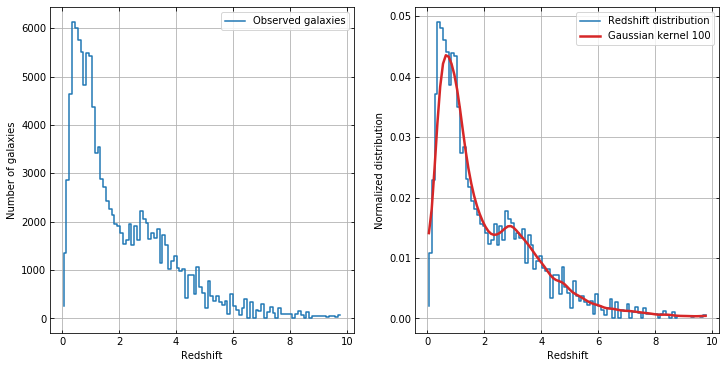

In [6]:
z_hist, z_edges = np.histogram(Z,bins=np.linspace(Z.min(),Z.max(),100))
z_hist_norm     = z_hist/z_hist.sum()
z_hist_gaussian = scipy.ndimage.filters.gaussian_filter(z_hist_norm, 2 ,order=0)

plt.figure(figsize=(12,6))
plt.subplot(121)
plt.step(z_edges[:-1],z_hist,label='Observed galaxies',color='tab:blue')
plt.tick_params(top=True, right=True,direction='in')
plt.xlabel('Redshift')
plt.ylabel('Number of galaxies')
plt.grid(True,which='both')
plt.legend()

plt.subplot(122)
plt.step(z_edges[:-1],z_hist_norm,color='tab:blue',label='Redshift distribution')
plt.plot(z_edges[:-1],z_hist_gaussian,color='tab:red',lw=2.5,label='Gaussian kernel 100')
plt.tick_params(top=True, right=True,direction='in')
plt.xlabel('Redshift')
plt.ylabel('Normalized distribution')
plt.grid(True,which='both')
plt.legend()

zdist = np.array((z_edges[:-1], z_hist_gaussian))

plt.savefig('redshift_distribution.png',dpi=300)

# Defining functions

In [7]:
def sample_redshift(zdist, n):
    """Generates random redshifts according to a distribution"""
    z = zdist[0,:]
    p = zdist[1,:] 
    z_min = z.min()
    z_max = z.max()
    cum  = np.cumsum(p) 
    func = interpolate.interp1d(cum, z, bounds_error=False,fill_value=(z_min,z_max))
    r    = np.random.uniform(0.01, 1, n)
    zout = func(r)
    return zout

def sample_sky(ra, dec, n):
    """Generates random points in the sky"""
    ra_rand    = np.random.uniform(ra.min(), ra.max(), n)
    dec_rand   = np.random.uniform(dec.min(), dec.max(), n)
    return ra_rand, dec_rand

def randoms(ra,dec,zdist,n):
    """Assembles the random points in the sky with the redshifts"""
    ra_rand, dec_rand = sample_sky(ra,dec,n)
    z_rand            = sample_redshift(zdist,n) 
    assert len(z_rand) == len(ra_rand)
    return ra_rand, dec_rand, z_rand

def lonlat2xyz(lon,lat,r=1):
    """Converts from RA DEC to comooving coordinates"""
    # degrees to radian conversions
    c = np.pi/180
    ic = 180/np.pi
    
    # radec to xyz
    x = r*np.cos(lon*c)*np.cos(lat*c)
    y = r*np.sin(lon*c)*np.cos(lat*c)
    z = r*np.sin(lat*c)
    return x,y,z

def box(ra, dec, z, params, cosmo_params):
    """Generates a 3d grid in comoving coordinates"""
    z_min = z.min()
    z_max = z.max()

    Om0 = cosmo_params['Omega_cdm']+cosmo_params['Omega_b']
    C = cosmo(H0=100,Om0=Om0)

    x = C.comoving_distance(z_max).value - C.comoving_distance(z_min).value #+ params['cell_size']
    z = C.comoving_transverse_distance(z_max)*(np.pi/360)
    y = C.comoving_transverse_distance(z_max)*(np.pi/360)
    
    bins  = (np.arange(0,x,params['cell_size']),np.arange(-z.value,z.value,params['cell_size']),np.arange(-y.value,y.value,params['cell_size']))
    return bins

def densfield(ra, dec, z, zdist, params, cosmo_params):
    """computes the density field inside a comooving grid"""
    z_min = z.min()
    z_max = z.max()
    
    Om0  = cosmo_params['Omega_cdm']+cosmo_params['Omega_b']
    C    = cosmo(H0=100,Om0=Om0)
    x0   = C.comoving_distance(z_min).value - 1

    ##### Comoving grid #####
    bins = box(ra, dec, z, params, cosmo_params)  
    
    ##### Random points #####
    ## Generating randoms ##
    rar,decr,zr = randoms(ra,dec,zdist,params['ran_dens'])
    
    ## From (zr,decr,rar) to (xr_axis,zr_axis,yr_axis) ##
    # From redshift to com distance
    comr_dist = C.comoving_distance(zr).value     
    # From spherical to cartesian
    xr_axis, yr_axis, zr_axis = lonlat2xyz(rar, decr, r=comr_dist)    
    xr_axis           = xr_axis - x0
    
    datar            = (xr_axis,zr_axis,yr_axis)   # Instead of (zr,decr,rar)
    hist_rand,edgesr = np.histogramdd(datar,bins,density=False)
    num_randoms      = np.sum(hist_rand)

    ##### SPICA points #####
    ## From (z,dec,ra) to (x_axis,z_axis,y_axis) ##
    # From redshift to com distance
    com_dist  = C.comoving_distance(z).value    
    # From spherical to cartesian
    x_axis, y_axis, z_axis = lonlat2xyz(ra, dec, r=com_dist) 
    x_axis     = x_axis - x0
    
    # Position of SPICA points in comooving coordinates
    data       = (x_axis,z_axis,y_axis)      
    # Histogram of SPICA points
    hist,edges = np.histogramdd(data,bins,density=False)        
    num_spica  = np.sum(hist)

    #### Applying mask threshold #####
    bad = hist_rand < params['threshold']*hist_rand.max()
    hist_rand[bad] = 0

    
    #### Normalizing histograms ####
    hist_rand_norm   = hist_rand/np.sum(hist_rand)
    hist_rand_scaled = hist_rand_norm * np.sum(hist)
    hist_norm        = hist/np.sum(hist) 

    ##### Density field #####
    dens       = np.zeros(hist_norm.shape)
    mask       = hist_rand_norm>0
    dens[mask] = ( (hist_norm[mask]) / (hist_rand_norm[mask]) ) - 1

    return dens, data, hist


# Computing the density field

In [8]:
dens, data, hist = densfield(RA,DEC,Z,zdist,params,cosmo_params)

In [9]:
print('Some characteristichs of the output: dens and data')
print('dens shape ', dens.shape)

print('dens min ', dens[:,:,:].min())
print('dens max ', dens[0,:,:].max())


print('data shape ', np.array(data).shape)

print('x_axis min ',np.array(data[0]).min(),' Mph')
print('x_axis max ',np.array(data[0]).max(),' Mph')

print('z_axis min ',np.array(data[1]).min(),' Mph')
print('z_axis max ',np.array(data[1]).max(),' Mph')

Some characteristichs of the output: dens and data
dens shape  (1276, 22, 22)
dens min  -0.9999679892443861
dens max  0.0
data shape  (3, 124999)
x_axis min  0.9961224283432273  Mph
x_axis max  6382.967987621849  Mph
z_axis min  -51.32794715659971  Mph
z_axis max  51.28949361572097  Mph


Some characteristichs of the output: hist
hist shape  (1276, 22, 22)  (Z, RA, DEC) in the coomoving grid
MIN number of galaxies in a cell  0.0
MAX number of galaxies in a cell   510.0
Number of galaxes in the grid  124958.0


Number of  5  h-3Mpc3 cells with more than  20  galaxies:  749


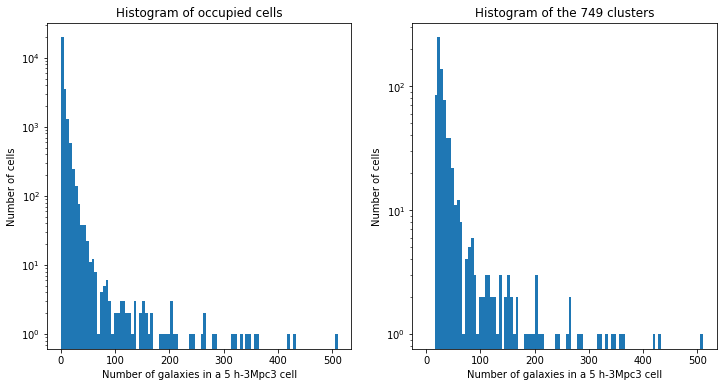

In [10]:
print('Some characteristichs of the output: hist')
print('hist shape ', hist.shape,' (Z, RA, DEC) in the coomoving grid')
print('MIN number of galaxies in a cell ', hist[:,:,:].min())
print('MAX number of galaxies in a cell  ', hist[:,:,:].max())
print('Number of galaxes in the grid ' , hist.sum())
print()
print()

nonzero = np.ndarray.nonzero(hist)
hist_nonzero = hist[nonzero]

clusters = hist >= params['cluster_definition']
hist_clusters = hist[clusters]
print('Number of ',params['cell_size'],' h-3Mpc3 cells with more than ',str(params['cluster_definition']),' galaxies: ',clusters.sum())

plt.figure(figsize=(12,6))
plt.subplot(121)
plt.title('Histogram of occupied cells')
plt.hist(hist_nonzero,bins=np.linspace(0,hist[:,:,:].max(),100))
plt.xlabel('Number of galaxies in a '+str(params['cell_size'])+' h-3Mpc3 cell')
plt.ylabel('Number of cells')
plt.yscale('log')

plt.subplot(122)
plt.title('Histogram of the '+str(clusters.sum())+' clusters')
plt.hist(hist_clusters,bins=np.linspace(0,hist[:,:,:].max(),100))
plt.xlabel('Number of galaxies in a '+str(params['cell_size'])+' h-3Mpc3 cell')
plt.ylabel('Number of cells')
plt.yscale('log')


plt.savefig('cluster_histogram.png',dpi=300)

# Plotting results

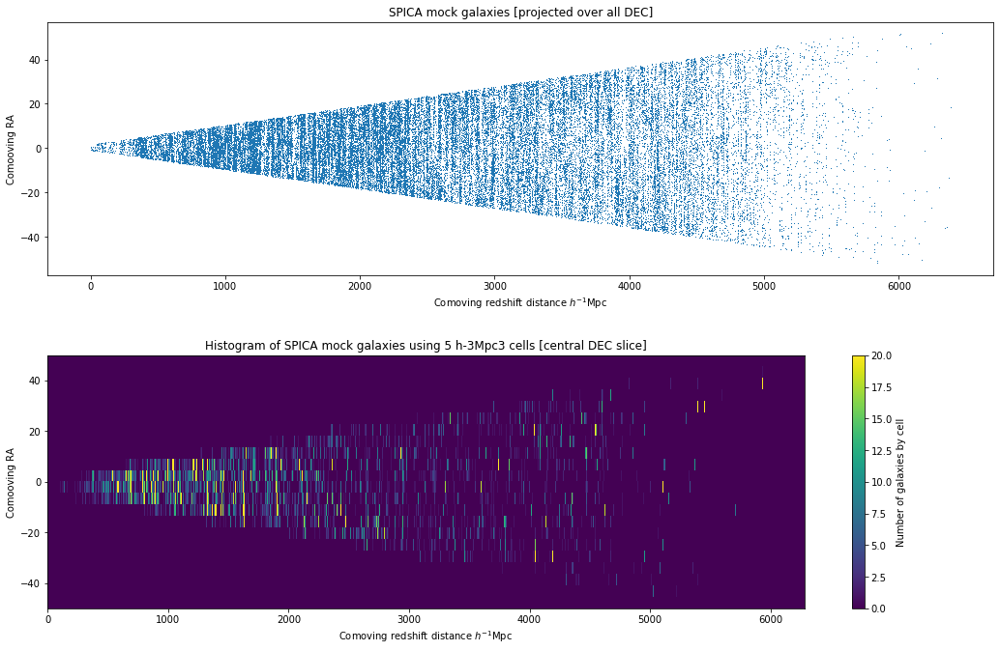

In [21]:
plt.figure(figsize=(15,10))
plt.subplot(211)
plt.title('SPICA mock galaxies [projected over all DEC]')
plt.plot(data[0],data[2],',') 
plt.xlabel('Comoving redshift distance $h^{-1}$Mpc') 
plt.ylabel('Comooving RA')

plt.subplot(212)
plt.title('Histogram of SPICA mock galaxies using '+str(params['cell_size'])+' h-3Mpc3 cells [central DEC slice]')
plt.colorbar(plt.imshow(np.transpose(hist[:,10,:]),extent=(0,6280,-50,50),aspect='auto',vmin=0, vmax=params['cluster_definition']),label='Number of galaxies by cell')
plt.xlabel('Comoving redshift distance $h^{-1}$Mpc')  
plt.ylabel('Comooving RA')
plt.tight_layout(pad=3.0)

plt.savefig('cone_diagram.png',dpi=300)


# Plotting results by slides (time consuming)

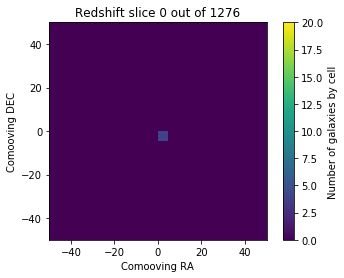

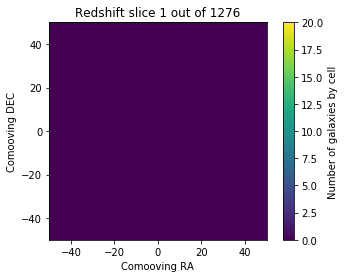

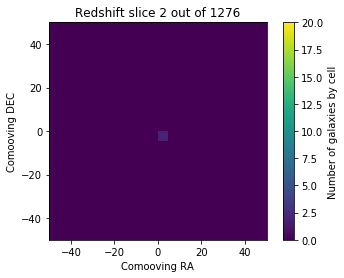

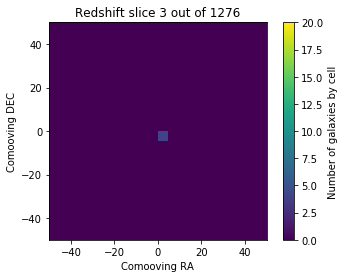

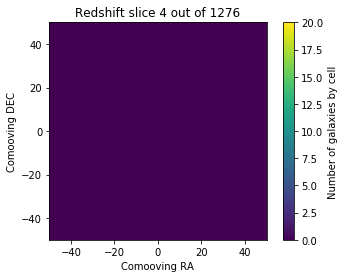

...

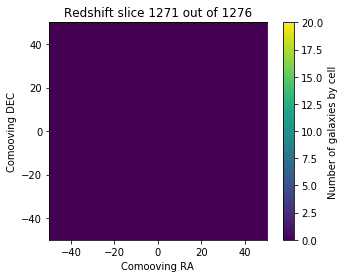

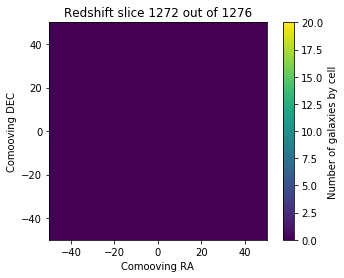

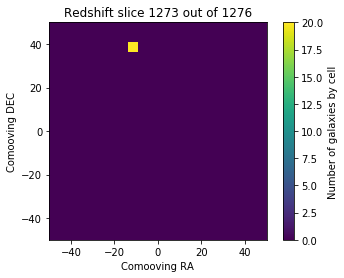

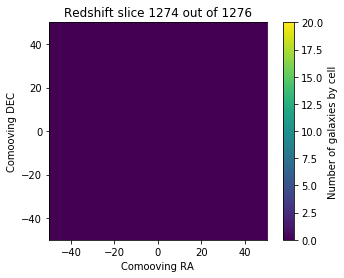

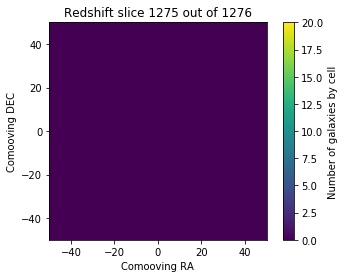

In [12]:
# Plotting the front view of the histogram
for i in range(len(hist[:,0,0])):
    plt.title('Redshift slice '+str(i)+ ' out of '+str(len(hist[:,0,0])))
    plt.colorbar(plt.imshow((hist[i,:,:]),extent=(-50,50,-50,50),vmin=0, vmax=params['cluster_definition']),label='Number of galaxies by cell')
    plt.xlabel('Comooving RA')
    plt.ylabel('Comooving DEC')
    plt.show()

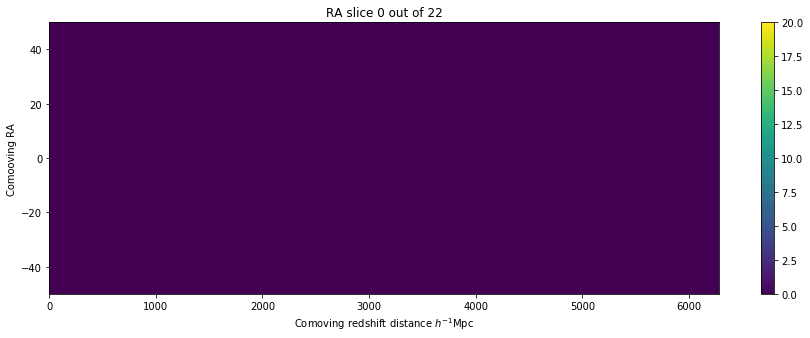

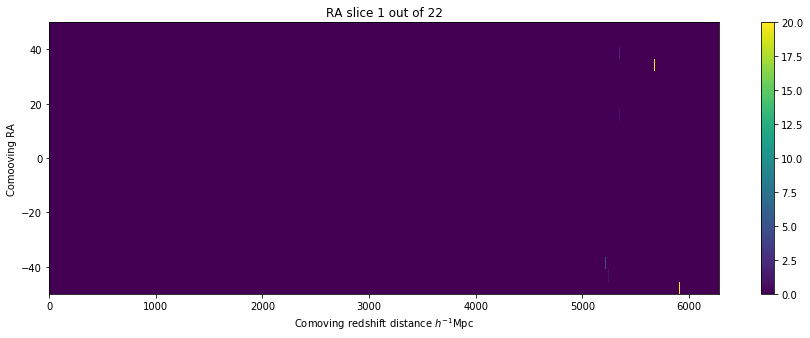

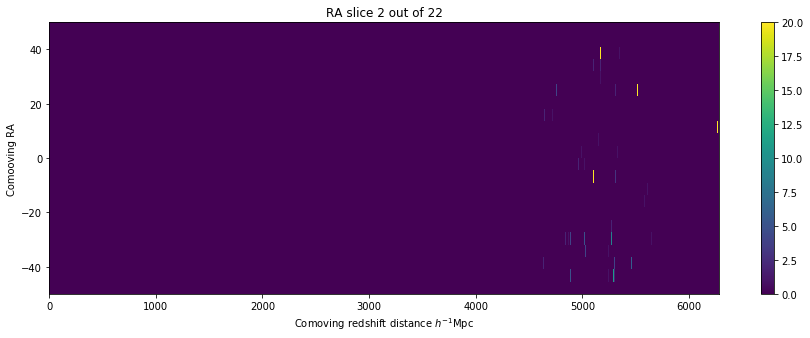

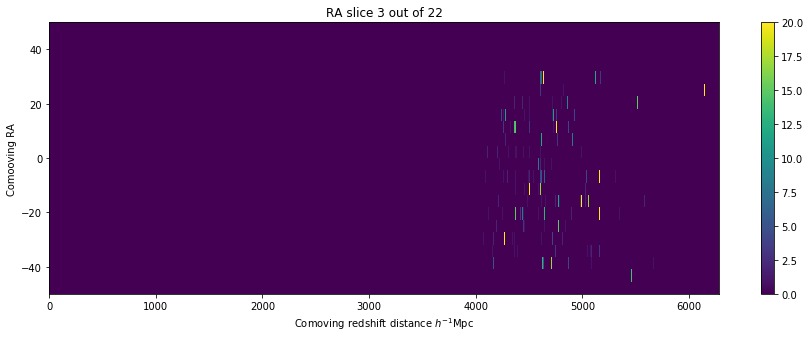

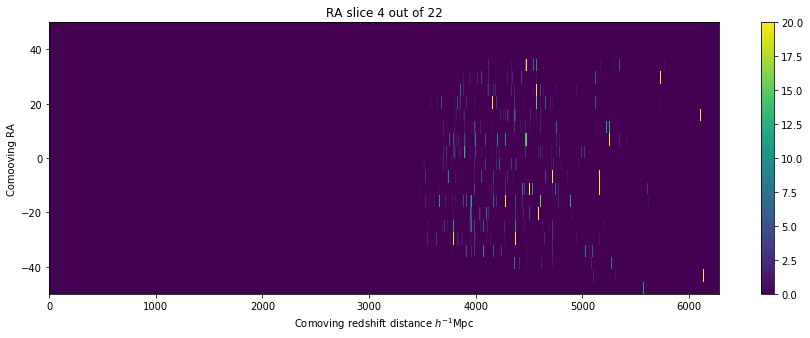

...

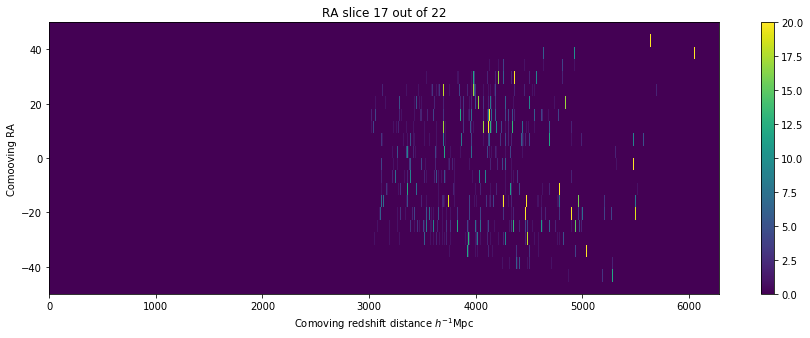

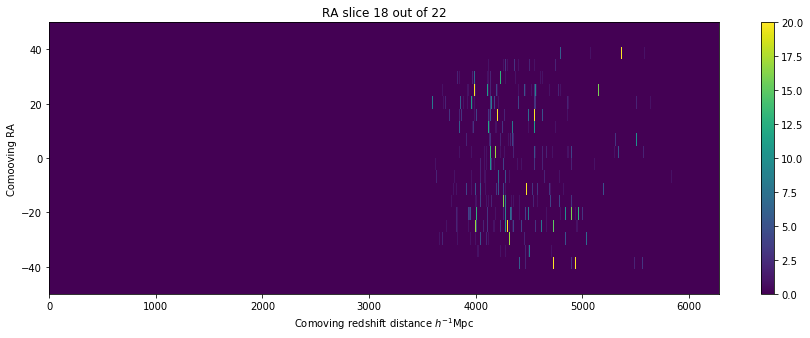

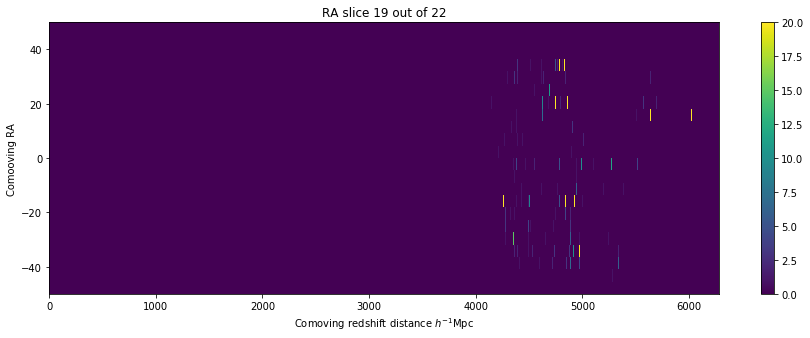

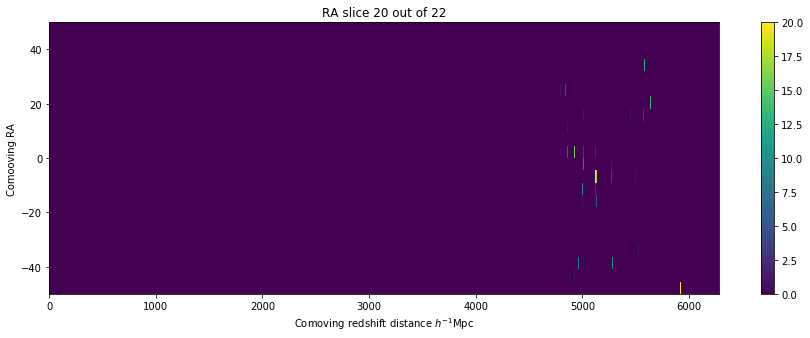

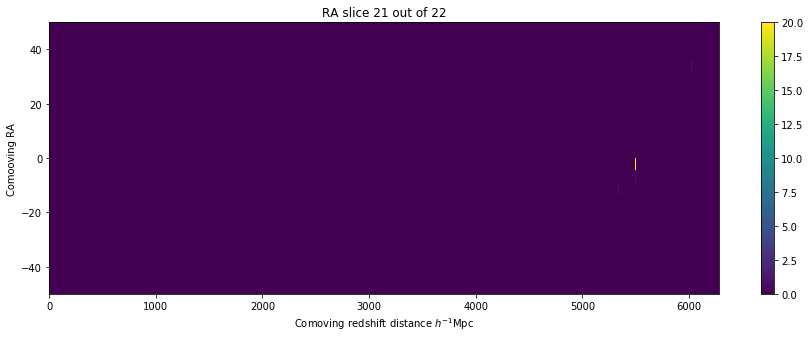

In [15]:

for i in range(len(hist[0,:,0])):
    plt.figure(figsize=(15,5))
    plt.title('RA slice '+str(i)+ ' out of '+str(len(hist[0,:,0])))
    plt.colorbar(plt.imshow(np.transpose(hist[:,i,:]),extent=(0,6280,-50,50),aspect='auto',vmin=0, vmax=params['cluster_definition']))
    plt.xlabel('Comoving redshift distance $h^{-1}$Mpc') 
    plt.ylabel('Comooving RA')
    plt.show()
